📂 Dataset structure:
Images folder: D:\COCO2017\train2017
Annotations: D:\COCO2017\annotations\instances_train2017.json

📖 Loading COCO annotations...
✅ Total images in dataset: 118287
✅ Total annotations: 860001
📸 Selected 20000 random images for processing.

🎨 Generating 50 side-by-side visualizations...


100%|█████████████████████████████████████████████| 50/50 [00:12<00:00,  4.11it/s]


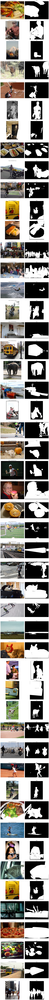


✅ Successfully displayed 50 original + mask pairs!


In [2]:

# VisionExtract Project - COCO 2017 Dataset Visualization
# Task: Explore dataset structure and visualize 50 image–mask pairs
# Dataset path: D:\COCO2017


import os
import random
import json
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
from tqdm import tqdm


#  up local dataset paths
base_dir = r"D:\COCO2017"
train_dir = os.path.join(base_dir, "train2017")
ann_file = os.path.join(base_dir, "annotations", "instances_train2017.json")

# dataset structure
print("📂 Dataset structure:")
print(f"Images folder: {train_dir}")
print(f"Annotations: {ann_file}")

if not os.path.exists(train_dir) or not os.path.exists(ann_file):
    raise FileNotFoundError("❌ Dataset folders not found. Please check your D:\\COCO2017 path.")

#  COCO annotations
print("\n📖 Loading COCO annotations...")
with open(ann_file, 'r') as f:
    coco_data = json.load(f)

images_info = coco_data["images"]
annotations = coco_data["annotations"]

print(f"✅ Total images in dataset: {len(images_info)}")
print(f"✅ Total annotations: {len(annotations)}")


#  Create a quick image ID → file mapping

id_to_filename = {img["id"]: img["file_name"] for img in images_info}


#  ollect 20,000 random images

sampled_images = random.sample(images_info, min(20000, len(images_info)))
print(f"📸 Selected {len(sampled_images)} random images for processing.")


# Function to create mask from annotation polygons

def create_mask(img_id, width, height):
    mask = Image.new("L", (width, height), 0)
    draw = ImageDraw.Draw(mask)

    for ann in annotations:
        if ann["image_id"] == img_id:
            segs = ann.get("segmentation", [])
            if isinstance(segs, list):
                for seg in segs:
                    if len(seg) > 4:  # valid polygon
                        poly = [(seg[i], seg[i+1]) for i in range(0, len(seg), 2)]
                        draw.polygon(poly, outline=1, fill=1)
    return mask


# Visualize 50 random image–mask pairs

print("\n🎨 Generating 50 side-by-side visualizations...")

fig, axes = plt.subplots(50, 2, figsize=(10, 200))
fig.subplots_adjust(hspace=0.2)

for idx in tqdm(range(50)):
    img_info = random.choice(sampled_images)
    img_path = os.path.join(train_dir, img_info["file_name"])

    if not os.path.exists(img_path):
        continue

    img = Image.open(img_path).convert("RGB")
    mask = create_mask(img_info["id"], img_info["width"], img_info["height"])

    # Display side-by-side
    axes[idx, 0].imshow(img)
    axes[idx, 0].set_title(f"Original: {img_info['file_name']}", fontsize=8)
    axes[idx, 0].axis("off")

    axes[idx, 1].imshow(mask, cmap="gray")
    axes[idx, 1].set_title("Mask", fontsize=8)
    axes[idx, 1].axis("off")

plt.tight_layout()
plt.show()

print("\n✅ Successfully displayed 50 original + mask pairs!")
